In [3]:
from image_ops import Dataset_Operations
import numpy as np
from scipy import ndimage
import matplotlib.pyplot as plt
from clustering import k_means
data = np.load("synthetic_data/ribosome/ribosome_clean.npy")

In [4]:
from skimage.transform import rescale
from sklearn.preprocessing import quantile_transform
def rescale_data(image_stack, desired_size):
    scaling_constant = desired_size/image_stack.shape[1]
    images = []
    for image in image_stack:
        images.append(rescale(image, scaling_constant))
    return np.asarray(images)
noise = np.random.normal(0, 7, data.shape)
data = rescale_data(data + noise, 128)
# fakes = np.abs(np.random.normal(0, 0.001, (500, 128, 128)))
normalized = quantile_transform(data.reshape(np.prod(data.shape)).reshape(-1,1), n_quantiles=100000, random_state=0, copy=True, output_distribution='normal')
normalized = normalized.reshape(data.shape)

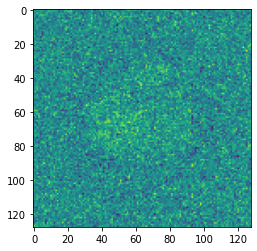

In [7]:
from scipy import signal, ndimage
full_data = normalized #np.vstack((data,fakes))
plt.imshow(full_data[8])
plt.show()

In [ ]:
ctf_data = []
for image in full_data:
    ctf_data.append(ndimage.gaussian_filter(full_data[8], 1))
ctf_data = np.array(ctf_data)

In [ ]:
plt.imshow(ctf_data[4])


100%|██████████| 39/39 [37:46<00:00, 57.90s/it]

  0%|          | 0/40 [00:00<?, ?it/s]

[3899, 744, 35, 128, 1142, 1144, 1364, 3006, 2038, 276, 17, 3866, 1125, 1143, 366, 1988, 2948, 1832, 25, 675, 2672, 1327, 1668, 3703, 263, 1706, 3421, 3074, 1791, 2937, 422, 1899, 853, 1365, 3085, 1709, 3218, 1417, 856, 2715]



100%|██████████| 40/40 [39:41<00:00, 59.91s/it]


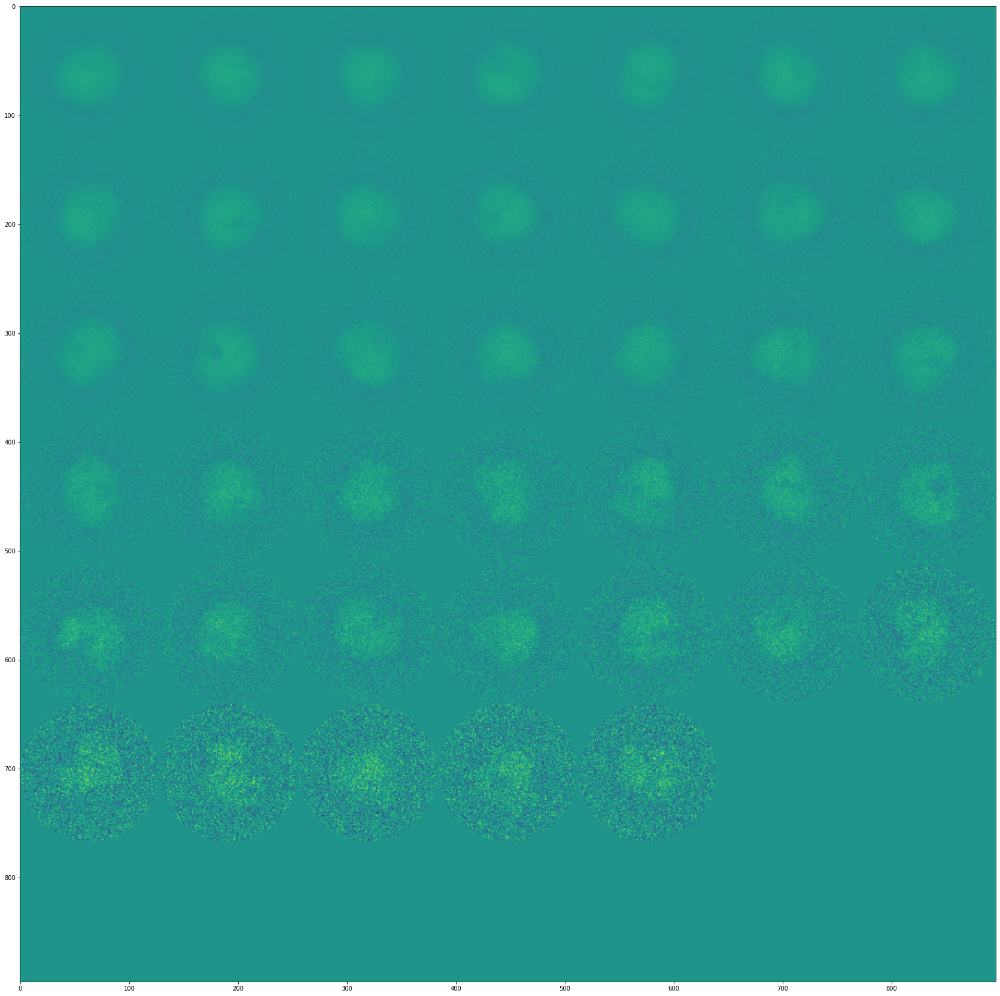

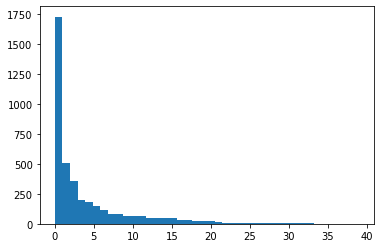


100%|██████████| 40/40 [39:45<00:00, 61.03s/it]


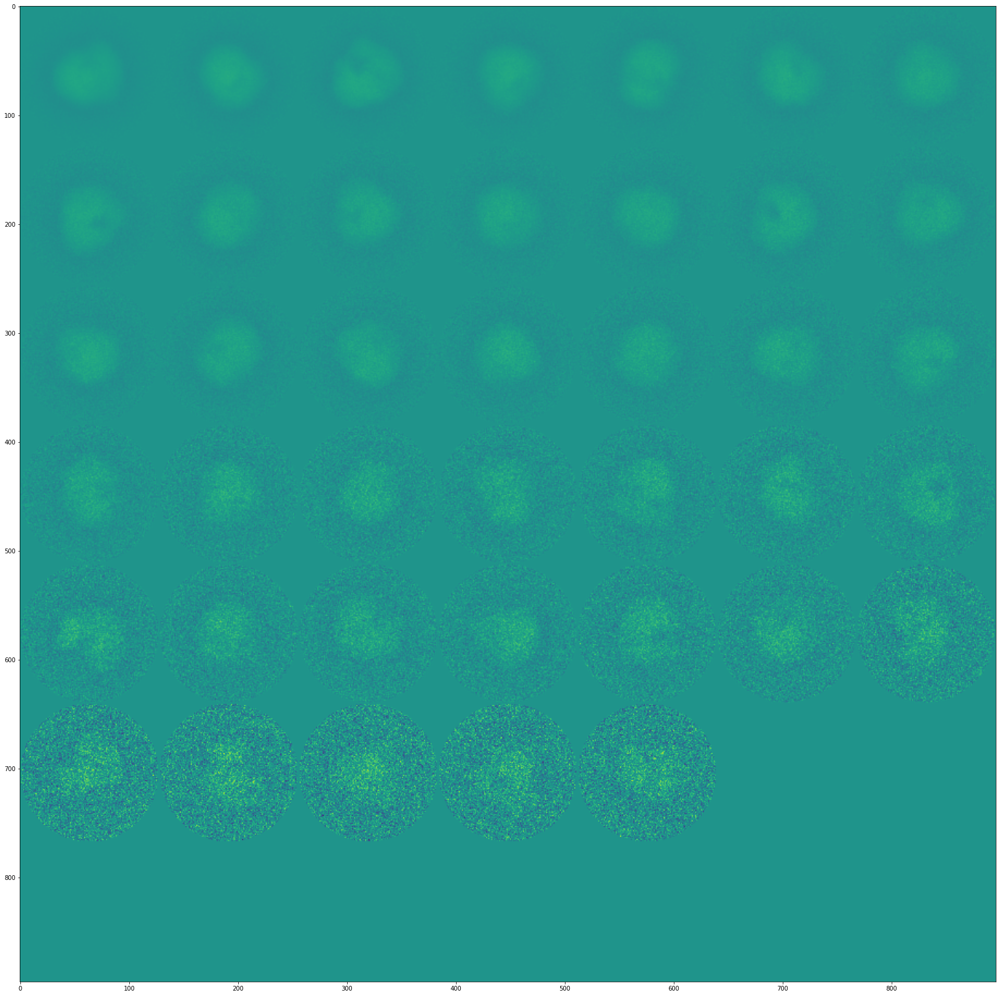

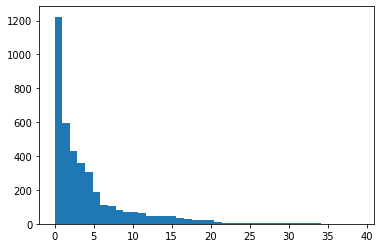


100%|██████████| 40/40 [39:32<00:00, 56.31s/it]


In [8]:
dataset = Dataset_Operations(full_data[:4000], metric='l2')
clustering = k_means(40, 100)
clustering.train(dataset, niter=3, init='k++')

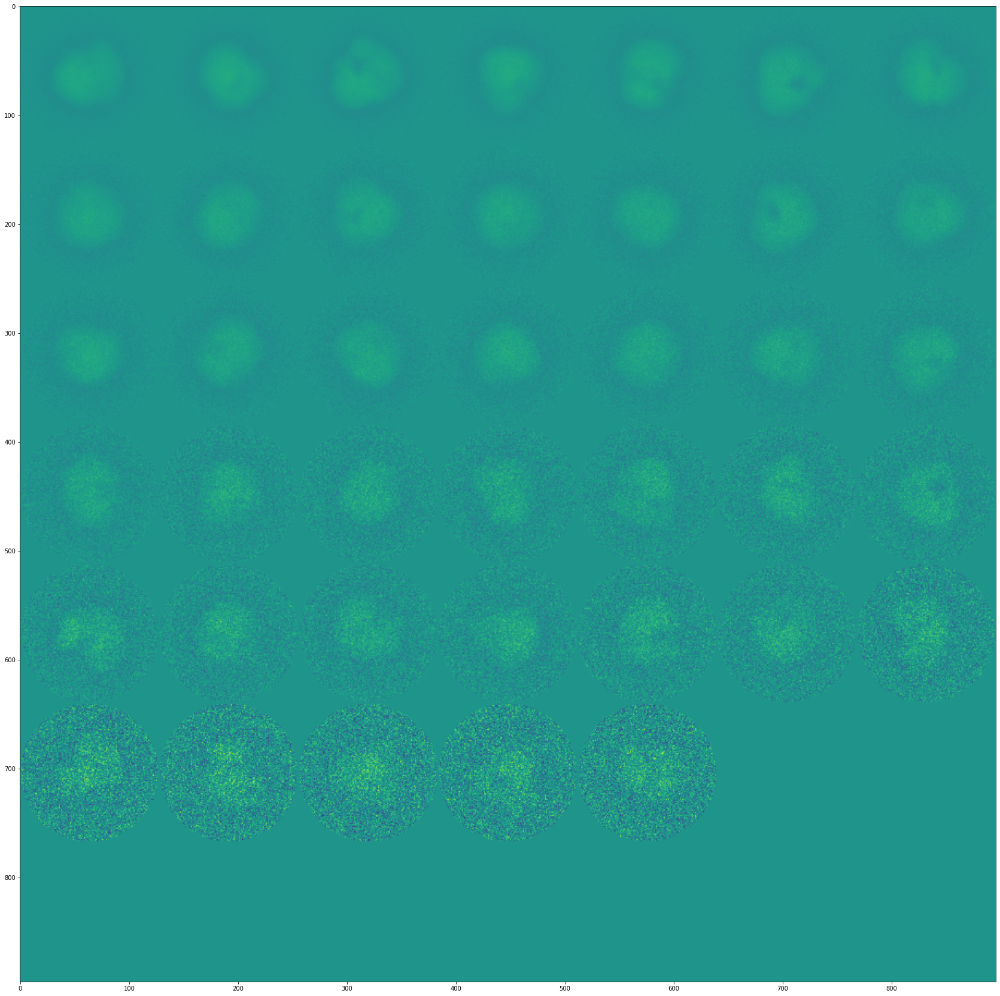

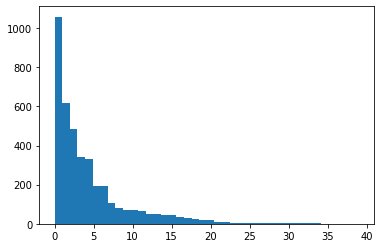

In [9]:
clustering.view_centers()

In [ ]:
from skimage.util import montage

/usr/local/lib/python3.7/site-packages/pywt/_multilevel.py:45: UserWarning: Level value of 6 is too high: all coefficients will experience boundary effects.
  "boundary effects.").format(level))

100%|██████████| 39/39 [2:00:32<00:00, 182.41s/it]

  0%|          | 0/40 [00:00<?, ?it/s]

[946, 988, 1009, 1220, 3116, 2999, 407, 2763, 445, 1278, 2723, 1819, 443, 2940, 853, 1828, 2738, 2795, 1939, 3018, 3725, 3400, 107, 1845, 2397, 2573, 3862, 1264, 925, 2619, 2505, 1714, 905, 1695, 3032, 2407, 2843, 3495, 154, 399]



100%|██████████| 40/40 [2:03:25<00:00, 186.27s/it]


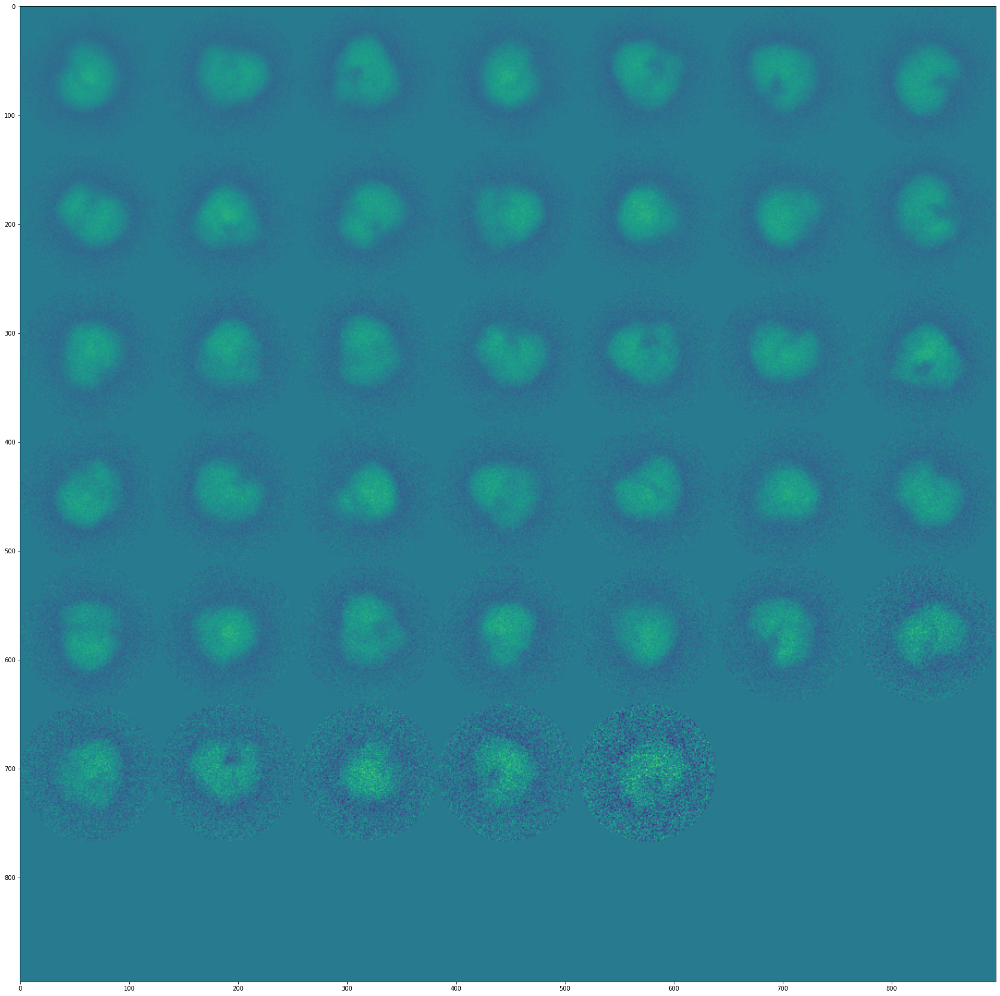

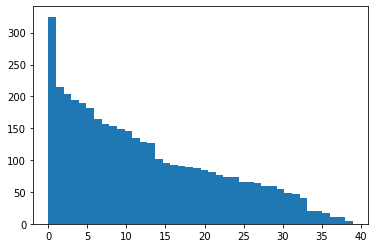


100%|██████████| 40/40 [1:57:57<00:00, 162.02s/it]


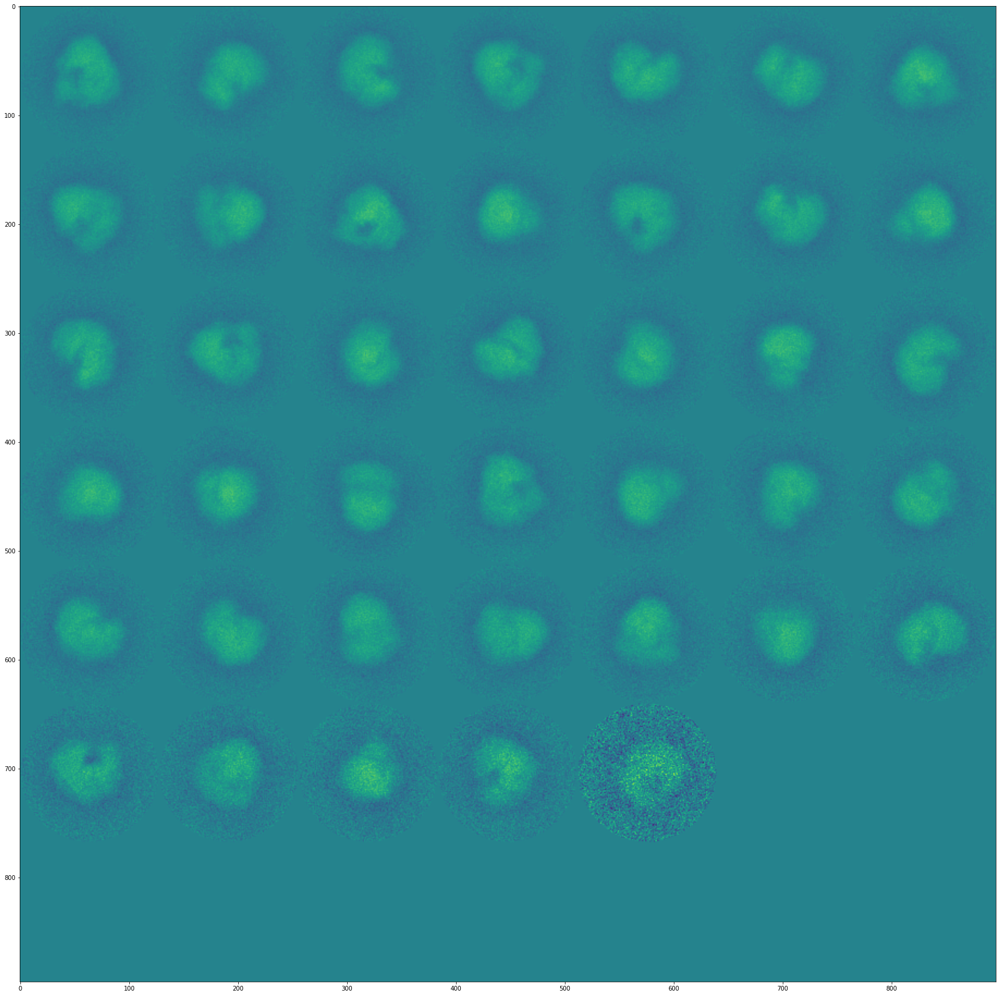

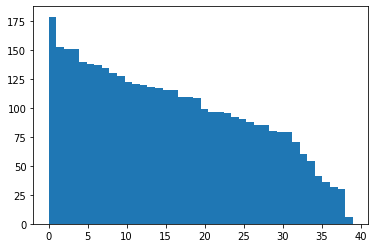


100%|██████████| 40/40 [1:42:03<00:00, 155.83s/it]


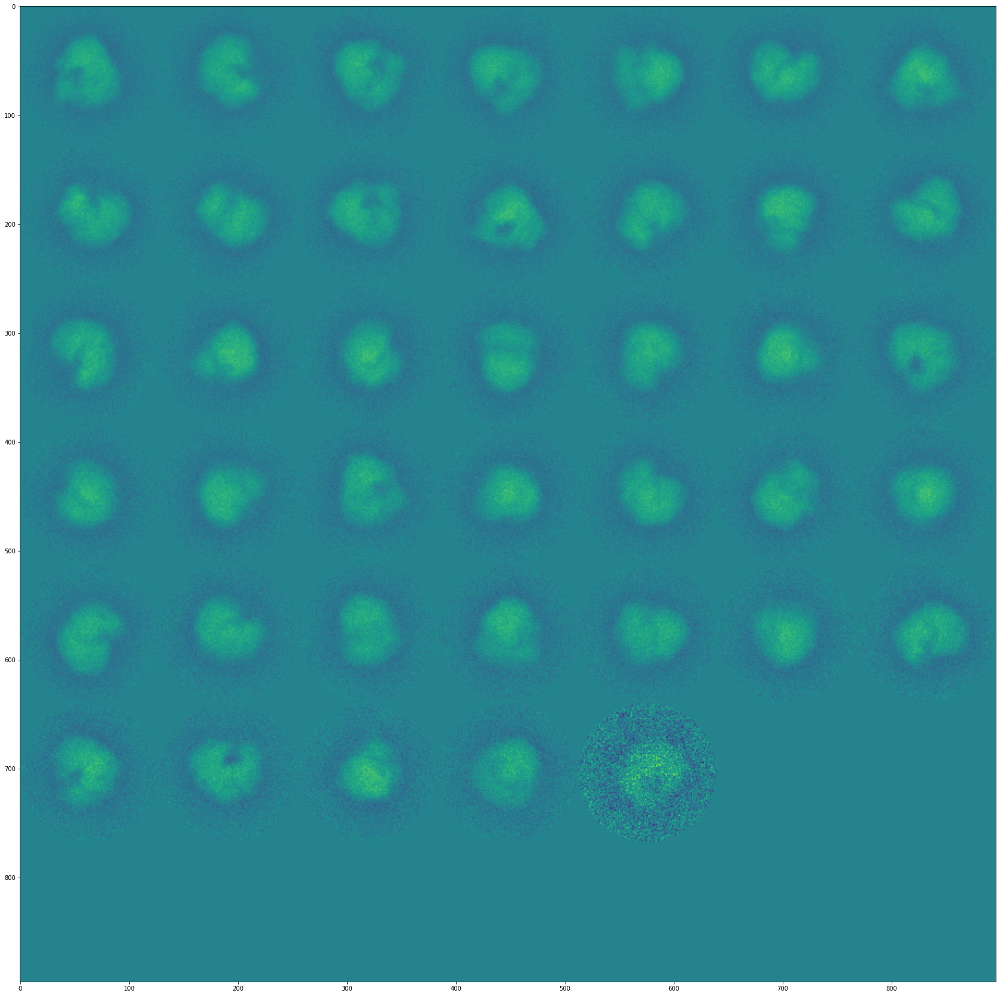

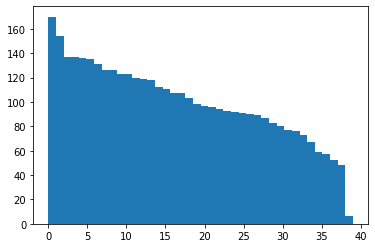


100%|██████████| 40/40 [1:42:49<00:00, 155.03s/it]


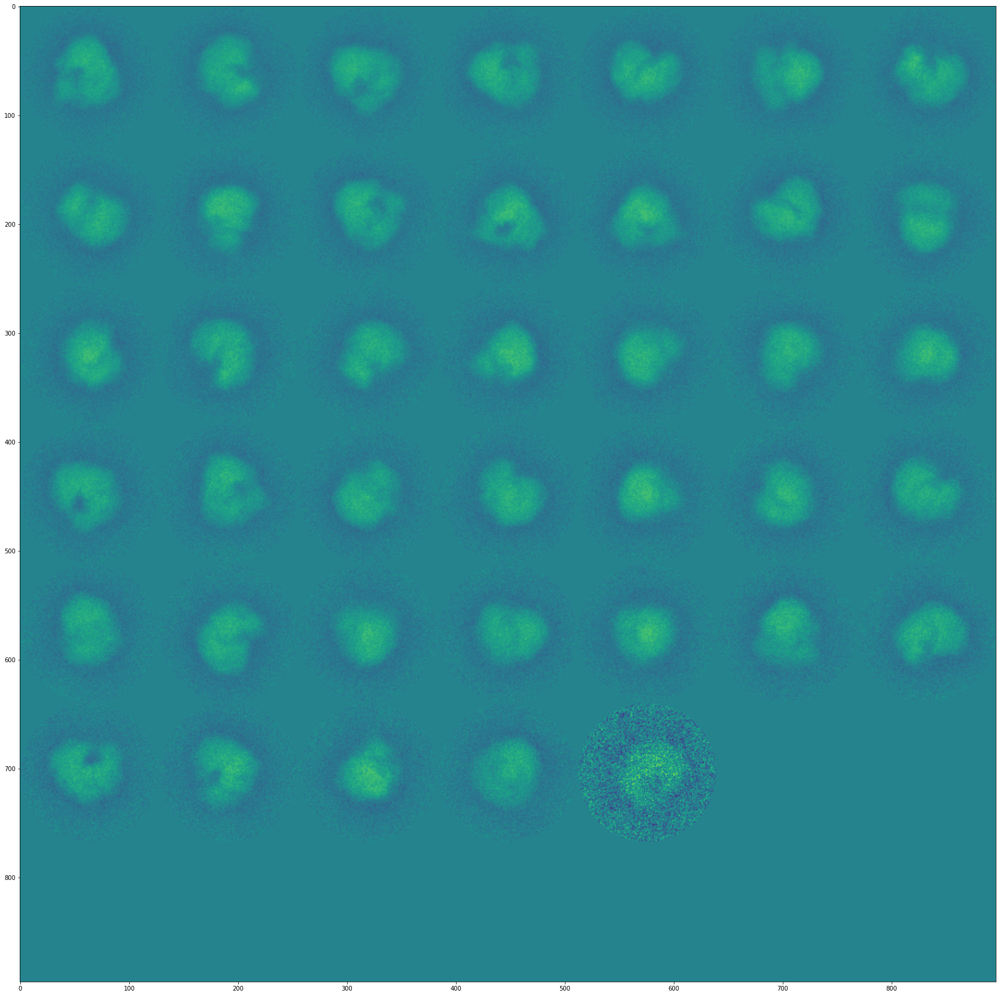

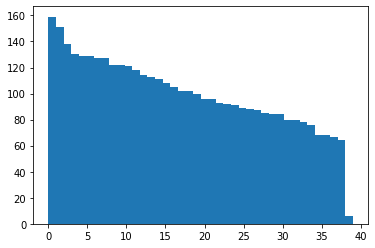


 52%|█████▎    | 21/40 [55:53<49:47, 157.23s/it]

In [ ]:
dataset2 = Dataset_Operations(full_data[:4000], metric='wemd')
clustering2 = k_means(40, 100)
clustering2.train(dataset2,niter=5, init='k++')

In [ ]:
clustering2.view_centers()

In [ ]:
for c in clustering2.centers:
    plt.imshow(c)
    plt.show()

In [ ]:
for i in set(clustering.labels[4002:].tolist()):
    print(int(i))

In [ ]:
[int(i) for i in set(clustering2.labels[4002:].tolist())]

In [ ]:
labels = clustering2.labels
centers = clustering2.centers
counts = dict()
for label in labels:
    counts[label] = counts[label] + 1 if label in counts else 1
counts = [(label, counts[label]) for label in counts]
center_counts = [(centers[int(label[0])], label[1]) for label in counts]
sorted_centers = sorted(center_counts, key=lambda x:x[1], reverse=True)
sorted_centers = [c[0] for c in sorted_centers]
fig, ax = plt.subplots(figsize=(30, 30))
ax.imshow(montage(np.array(sorted_centers)))
plt.show()
counts = sorted(counts, key=lambda x:x[1], reverse=True)
sorted_labels = np.zeros(len(labels))
for i, entry in enumerate(counts):
    sorted_labels[labels == entry[0]] = i
labels = sorted_labels

plt.hist(labels, bins=40)
plt.show()

In [ ]:
idx = np.array([i for i in range(4501)])
cluster = idx[labels == 6]
cluster[cluster <= 4001]

In [ ]:
sorted_centers

In [ ]:
x = np.zeros((10,10))
x[2:4,2:4] = 0.5
y = np.zeros((10,10))
y[2:4,2:4] = 1
# ims = np.array([x,y])
plt.imshow(montage(ims, rescale_intensity=True))

In [ ]:
from scipy import ndimage
cms  = []
for image in data:
    cm = ndimage.measurements.center_of_mass(image)
    cms.append(cm[0])
    cms.append(cm[1])

In [ ]:
real =  np.load("raw_ribosome_data.npy")

In [ ]:
from scipy import signal
freqs, psd = signal.welch(real[10].reshape(129600))

plt.figure(figsize=(5, 4))
plt.semilogx(freqs, psd)
plt.title('PSD: power spectral density')
plt.xlabel('Frequency')
plt.ylabel('Power')
plt.tight_layout()